In [5]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import plotly.express as px
import json

In [3]:
import plotly.io as pio
pio.renderers.default = 'browser'

In [3]:
dtypes = {
    6: 'float',  # or another appropriate type
    7: 'float',
    9: 'object',
    12: 'object',
    13: 'object'
}
df = pd.read_csv('teste_indicium_precificacao_v2.csv', dtype=dtypes)


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48811 entries, 0 to 48810
Data columns (total 15 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             48811 non-null  int64  
 1   nome                           48795 non-null  object 
 2   host_id                        48811 non-null  int64  
 3   host_name                      48790 non-null  object 
 4   bairro_group                   48811 non-null  object 
 5   bairro                         48811 non-null  object 
 6   latitude                       48811 non-null  float64
 7   longitude                      48811 non-null  float64
 8   room_type                      48811 non-null  object 
 9   price                          48811 non-null  object 
 10  minimo_noites                  48811 non-null  int64  
 11  numero_de_reviews              48811 non-null  int64  
 12  reviews_por_mes                48811 non-null 

In [5]:
## Transformação e limpeza dos dados

df['id'] = df['id'].apply(str)
df['host_id'] = df['host_id'].apply(str)

In [6]:
#Verificando valores nulos
print(df.isnull().sum())

id                                0
nome                             16
host_id                           0
host_name                        21
bairro_group                      0
bairro                            0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimo_noites                     0
numero_de_reviews                 0
reviews_por_mes                   0
calculado_host_listings_count     0
disponibilidade_365               0
dtype: int64


In [7]:
df.describe()

,latitude,longitude,minimo_noites,numero_de_reviews,disponibilidade_365
count,48811.00000,48811.000000,48811.000000,48811.000000,48811.000000
mean,40.72896,-73.952207,7.033292,23.259245,112.766262
std,0.05452,0.046086,20.520108,44.554239,131.634861
min,40.50641,-74.244420,1.000000,0.000000,0.000000
25%,40.69010,-73.983080,1.000000,1.000000,0.000000
50%,40.72307,-73.955700,3.000000,5.000000,45.000000
75%,40.76312,-73.936380,5.000000,23.000000,227.000000
max,40.91306,-73.712990,1250.000000,629.000000,365.000000


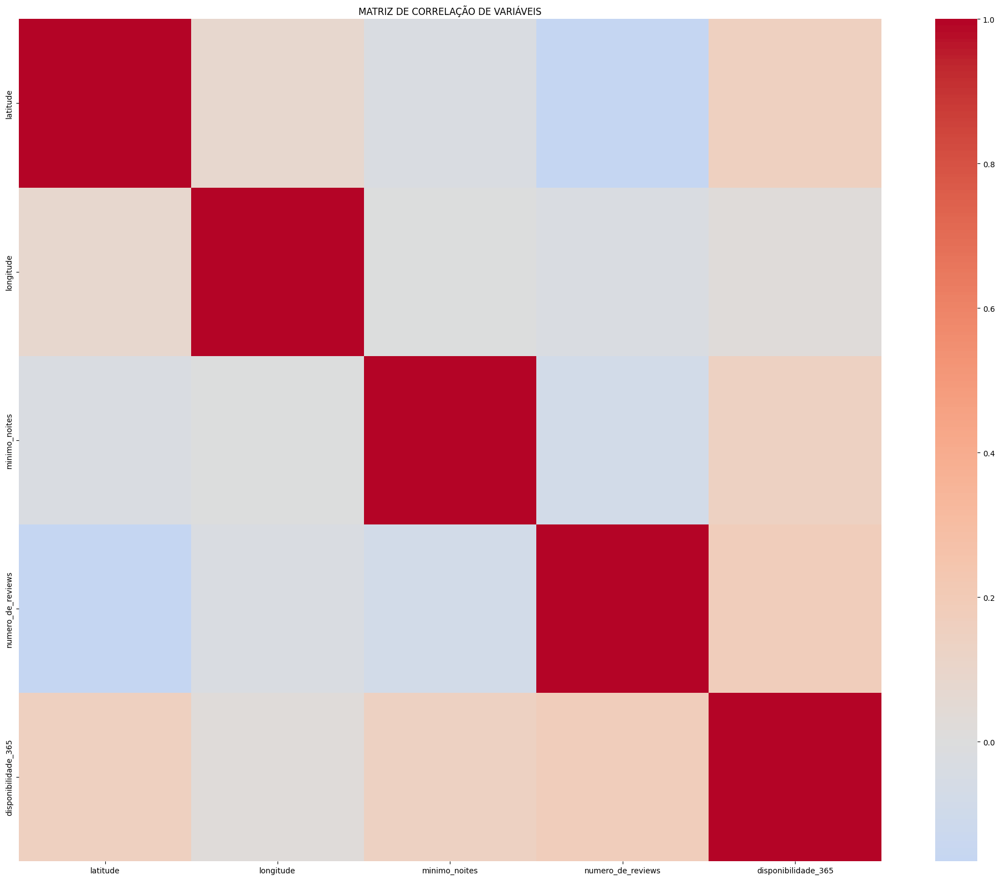

In [8]:
# Matriz de correlação
df_preparacao = df.copy()
colunas_numericas = df_preparacao.select_dtypes(include=[np.number]).columns
df_preparacao = df_preparacao[colunas_numericas]

plt.figure(figsize = (20,16))
sns.heatmap(df_preparacao.corr(), cmap='coolwarm', center=0, annot=False)
plt.title('MATRIZ DE CORRELAÇÃO DE VARIÁVEIS')
plt.tight_layout()
plt.show()

In [9]:
    # Identificar colunas categóricas
    colunas_object = df_preparacao.select_dtypes(include=['object']).columns

    # Primeira forma (recomendada): usando replace
    df_preparacao[colunas_object] = df_preparacao[colunas_object].fillna('MISSING')

Utilizando o Plotly para gerar mapas

In [10]:
fig = px.scatter_map(
    df,
    lat='latitude', 
    lon='longitude',
    hover_data=['nome', 'price'],
    zoom=11,
    center=dict(lat=40.7128, lon=-74.0060),
)

fig.show()


Tentando criar zonas na cidade de Nova Iorque de acordo com os BORROUGHS e NEIGHBOURHOODS.

Objetivo: fazer Choropleth Map

In [11]:
nyc_borroughs = json.load(open("new-york-city-b.geojson"))
nyc_neighbourhoods = json.load(open("nyc_n.geojson"))

In [12]:
nyc_borroughs['features'][0].keys()


dict_keys(['type', 'properties', 'geometry'])

In [13]:
nyc_neighbourhoods['features'][0].keys()

dict_keys(['type', 'properties', 'geometry'])

In [14]:
nyc_borroughs['features'][0]['properties']

{'name': 'Staten Island',
 'cartodb_id': 1,
 'created_at': '2013-03-09T02:42:03.692Z',
 'updated_at': '2013-03-09T02:42:03.989Z'}

In [15]:
nyc_neighbourhoods['features'][0]['properties']

{'neighborhood': 'Allerton',
 'boroughCode': '2',
 'borough': 'Bronx',
 'X.id': 'http://nyc.pediacities.com/Resource/Neighborhood/Allerton'}

In [16]:
#matching keys to a new table 
b_id_map  = {}

for feature in nyc_borroughs['features']:
    feature['id'] = feature['properties']['cartodb_id']
    b_id_map[feature['properties']['name']] = feature['id']



In [17]:
b_id_map

{'Staten Island': 1, 'Queens': 2, 'Brooklyn': 3, 'Manhattan': 4, 'Bronx': 5}

In [18]:
df ['b_id'] = df['bairro_group'].apply(lambda x: b_id_map[x])

In [19]:
df.head()

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,b_id
0,36483010,Comfy 1 Bedroom in Midtown East,274311461,Scott,Manhattan,Midtown,40.91306,-73.89389,Entire home/apt,200,6,0,0,1,176,4
1,36482783,Brooklyn Oasis in the heart of Williamsburg,274307600,Jonathan,Brooklyn,Williamsburg,40.91234,-73.89417,Private room,190,7,0,0,1,341,3
2,36481615,"Peaceful space in Greenpoint, BK",274298453,Adrien,Brooklyn,Greenpoint,40.91169,-73.90564,Private room,54,6,0,0,1,15,3
3,36478343,Welcome all as family,274273284,Anastasia,Manhattan,East Harlem,40.91167,-73.89566,Private room,140,1,0,0,1,180,4
4,36472710,CozyHideAway Suite,274225617,Alberth,Queens,Briarwood,40.90804,-73.90005,Entire home/apt,58,1,0,0,1,159,2


Referências:

Plotting Choropleth Maps using Python (Plotly) - https://www.youtube.com/watch?v=aJmaw3QKMvk
Geojson dos Neighbourhoods: https://github.com/HodgesWardElliott/custom-nyc-neighborhoods
Geojson dos Boroughs: https://github.com/codeforgermany/click_that_hood/blob/main/public/data/new-york-city-boroughs.geojson



In [7]:
gdf_nyc = gpd.read_file('new-york-city-b.geojson')
gdf_nyc.head()

,name,cartodb_id,created_at,updated_at,geometry
0,Staten Island,1,2013-03-09 02:42:03.692000+00:00,2013-03-09 02:42:03.989000+00:00,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,Queens,2,2013-03-09 02:42:03.692000+00:00,2013-03-09 02:42:03.989000+00:00,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
2,Brooklyn,3,2013-03-09 02:42:03.692000+00:00,2013-03-09 02:42:03.989000+00:00,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,Manhattan,4,2013-03-09 02:42:03.692000+00:00,2013-03-09 02:42:03.989000+00:00,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,Bronx,5,2013-03-09 02:42:03.692000+00:00,2013-03-09 02:42:03.989000+00:00,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


In [8]:
gdf_nyc.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [13]:
gdf_nyc.to_crs(3857).area.sum()

np.float64(1368039490.098018)

<Axes: >

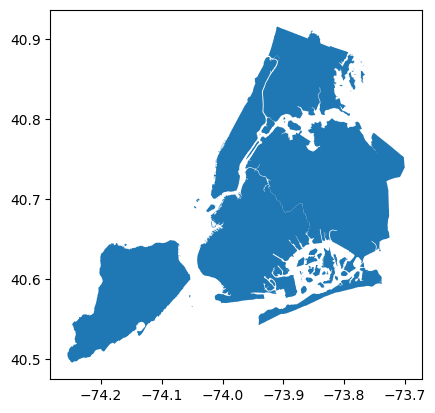

In [14]:
gdf_nyc.plot()

In [15]:
gdf_nyc.shape

(5, 5)

In [ ]:
df.sjoin(gdf_nyc['NAME','cartodb_id', 'GEOMETRY